# Secion 4

### Lec:  Color Mappings

In [1]:
import cv2
import matplotlib.pyplot as plt

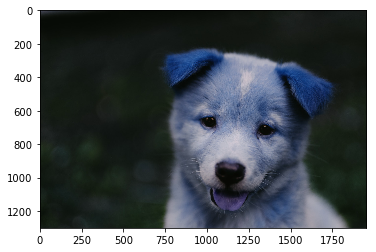

In [18]:
img =cv2.imread('./course_content/DATA/00-puppy.jpg')
plt.imshow(img)

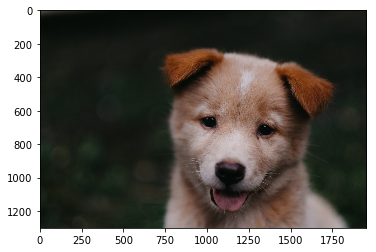

In [19]:
img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
plt.imshow(img)

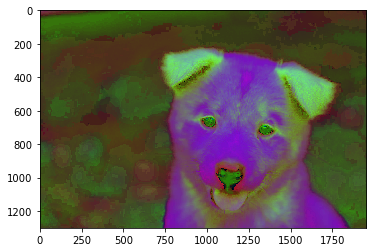

In [20]:
img = cv2.cvtColor(img,cv2.COLOR_BGR2HSV)
plt.imshow(img)

# Lec: Blending and Pasting Images

In [1]:
import cv2
import matplotlib.pyplot as plt

In [9]:
img1 = cv2.imread('course_content/DATA/dog_backpack.png')
img1 = cv2.cvtColor(img1,cv2.COLOR_BGR2RGB)
img2 = cv2.imread('course_content/DATA/watermark_no_copy.png')
img2 = cv2.cvtColor(img2,cv2.COLOR_BGR2RGB)


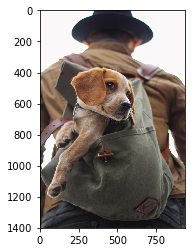

In [10]:
plt.imshow(img1)

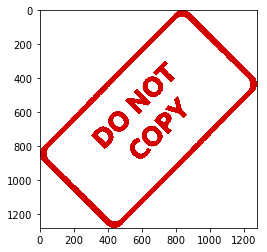

In [11]:
plt.imshow(img2)

In [12]:
img1.shape

(1401, 934, 3)

In [13]:
img2.shape

(1280, 1277, 3)

In [15]:
#BLENDING IMAGES OF THE SAME SIZE
img1 = cv2.resize(img1,(512,512))
img2 = cv2.resize(img2,(512,512))

In [16]:
img2.shape

(512, 512, 3)

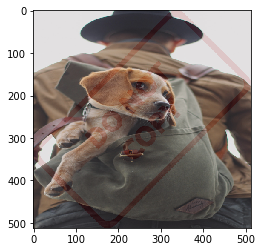

In [19]:
blended = cv2.addWeighted(src1=img1,alpha=0.8,src2=img2,beta=0.1,gamma=0)
plt.imshow(blended)

In [56]:
# OVERLAY SMALL IMAGE ON TOP OF A LARGER IMAGE( NO BLENDING)
# NUMPY reassignment

img1 = cv2.imread('course_content/DATA/dog_backpack.png')
img1 = cv2.cvtColor(img1,cv2.COLOR_BGR2RGB)
img2 = cv2.imread('course_content/DATA/watermark_no_copy.png')
img2 = cv2.cvtColor(img2,cv2.COLOR_BGR2RGB)


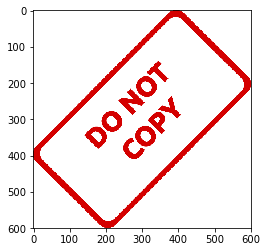

In [57]:
img2 = cv2.resize(img2,(600,600)) 
plt.imshow(img2)

In [51]:
large_img = img1
small_img = img2

In [52]:
large_img.shape

(1401, 934, 3)

In [53]:
x_offset = 100
y_offset = 100

In [54]:
x_end = x_offset + small_img.shape[1]
y_end = x_offset + small_img.shape[0]

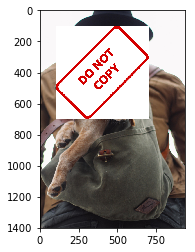

In [55]:
large_img[y_offset:y_end,x_offset:x_end] = small_img
plt.imshow(large_img)

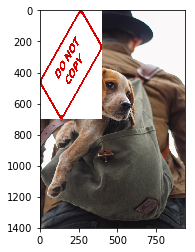

In [71]:
img1 = cv2.imread('course_content/DATA/dog_backpack.png')
img1 = cv2.cvtColor(img1,cv2.COLOR_BGR2RGB)
img2 = cv2.imread('course_content/DATA/watermark_no_copy.png')
img2 = cv2.cvtColor(img2,cv2.COLOR_BGR2RGB)
img2 = cv2.resize(img2,(400,700)) 

img1[0:img2.shape[0],0:img2.shape[1]]=img2
plt.imshow(img1)

# Blending and Pasting Images Part Two - Masks

In [ ]:
# BLENDING TOGETHER IMAGES OF DIFFERENT SIZES

In [2]:
img1 = cv2.imread('course_content/DATA/dog_backpack.png')
img1 = cv2.cvtColor(img1,cv2.COLOR_BGR2RGB)
img2 = cv2.imread('course_content/DATA/watermark_no_copy.png')
img2 = cv2.cvtColor(img2,cv2.COLOR_BGR2RGB)
img2 = cv2.resize(img2,(600,600)) 



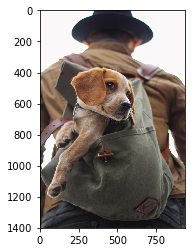

In [3]:
plt.imshow(img1)

In [4]:
img1.shape

(1401, 934, 3)

In [6]:
x_offset = 934-600
y_offset = 1401-600

In [7]:
rows,cols,channels = img2.shape

In [9]:
cols

600

In [10]:
roi = img1[y_offset:1401,x_offset:934]

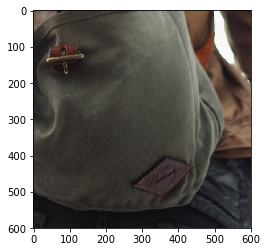

In [11]:
plt.imshow(roi)

In [12]:
img2_gray = cv2.cvtColor(img2,cv2.COLOR_RGB2GRAY)

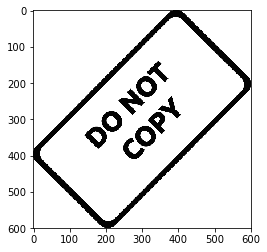

In [13]:
plt.imshow(img2_gray,cmap='gray')

In [14]:
mask_inv = cv2.bitwise_not(img2_gray)

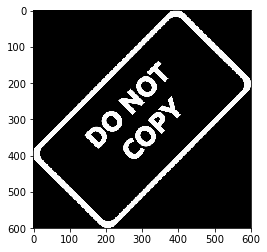

In [17]:
plt.imshow(mask_inv,cmap='gray')

In [18]:
mask_inv.shape


(600, 600)

In [19]:
import numpy as np

In [20]:
white_background = np.full(img2.shape,255,dtype=np.uint8)

In [21]:
white_background.shape

(600, 600, 3)

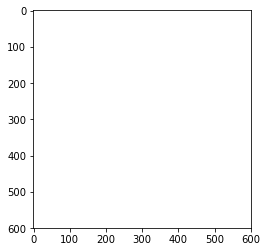

In [22]:
plt.imshow(white_background)

In [24]:
bk = cv2.bitwise_or(white_background,white_background,mask=mask_inv)

In [25]:
bk.shape

(600, 600, 3)

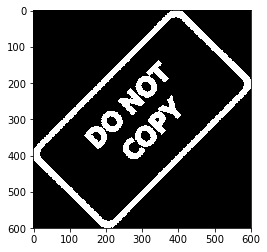

In [26]:
plt.imshow(bk)

In [27]:
fg = cv2.bitwise_or(img2,img2,mask=mask_inv)

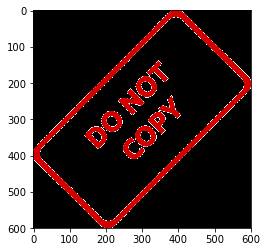

In [28]:
plt.imshow(fg)

In [29]:
final_roi = cv2.bitwise_or(roi,fg)

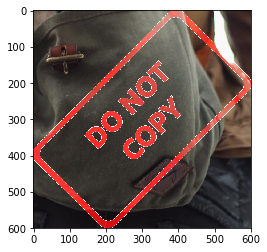

In [30]:
plt.imshow(final_roi)

In [31]:
large_img = img1
small_img = final_roi

In [33]:
large_img[y_offset:y_offset+small_img.shape[0],x_offset:x_offset+small_img.shape[1]] = small_img

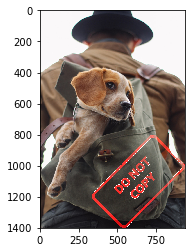

In [34]:
plt.imshow(large_img)

#  Image Thresholding

In [20]:
import cv2
import matplotlib.pyplot as plt
import numpy as np

In [33]:
img = cv2.imread('./course_content/DATA/rainbow.jpg',0)

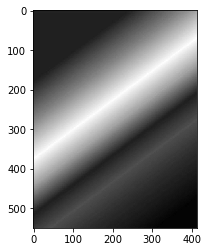

In [34]:
plt.imshow(img,cmap='gray')

In [35]:
img.max()

214

In [36]:
ret,thresh1 = cv2.threshold(img,127,255,cv2.THRESH_TOZERO_INV)

In [37]:
ret

127.0

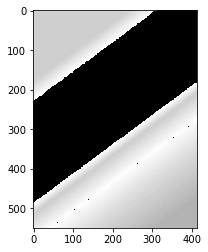

In [38]:
plt.imshow(thresh1,cmap='gray')

In [62]:
img = cv2.imread('course_content/DATA/crossword.jpg',0)


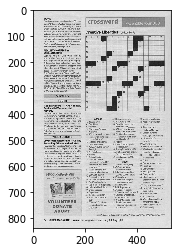

In [63]:
plt.imshow(img,cmap='gray')

In [84]:
def show_pic(img):
    fig = plt.figure(figsize=(15,15))
    ax = fig.add_subplot(111)
    ax.imshow(img,cmap='gray')

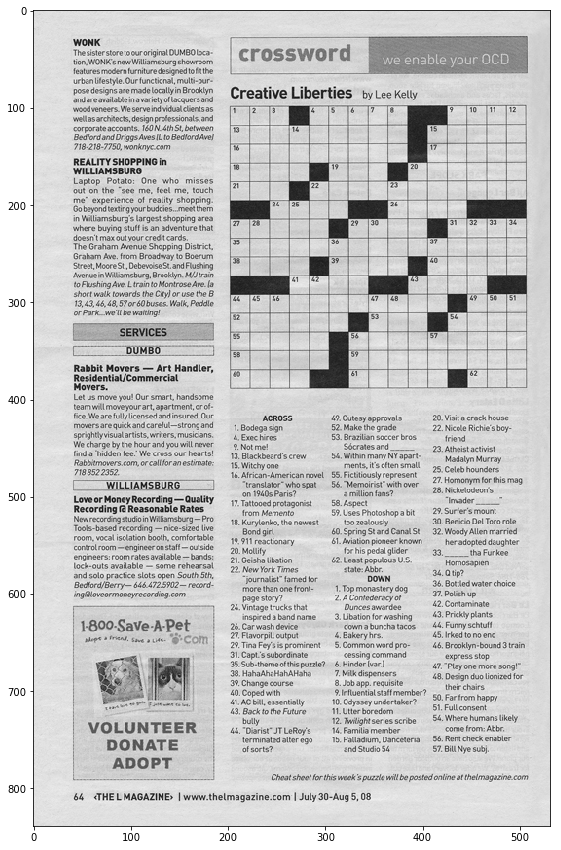

In [85]:
show_pic(img)

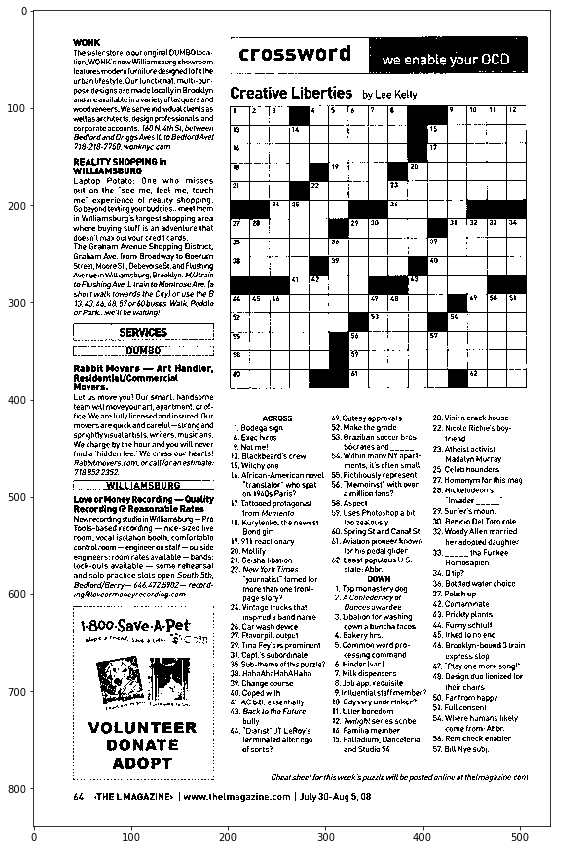

In [86]:
ret,th1 = cv2.threshold(img,150,255,cv2.THRESH_BINARY)
show_pic(th1)

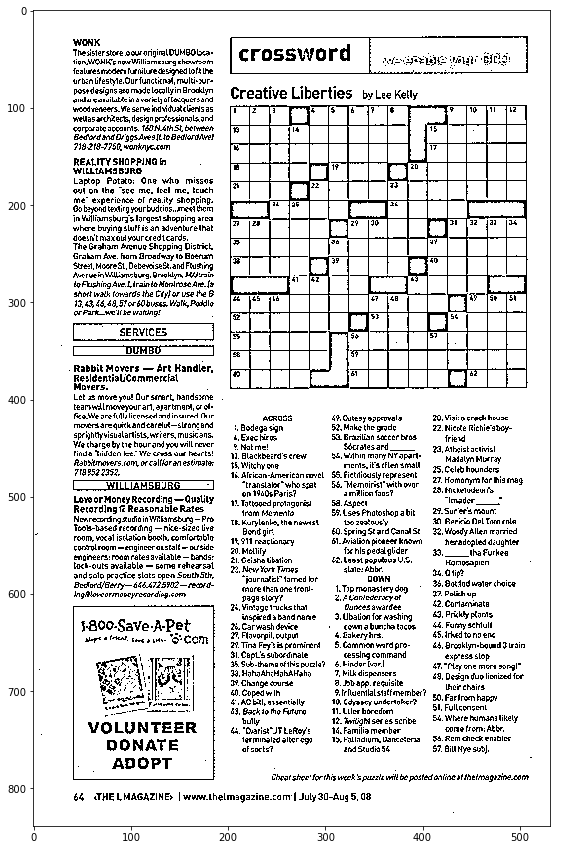

In [89]:
# img = img.astype(np.uint8)
th2 = cv2.adaptiveThreshold(img,255,cv2.ADAPTIVE_THRESH_GAUSSIAN_C,cv2.THRESH_BINARY,11,15)
show_pic(th2)

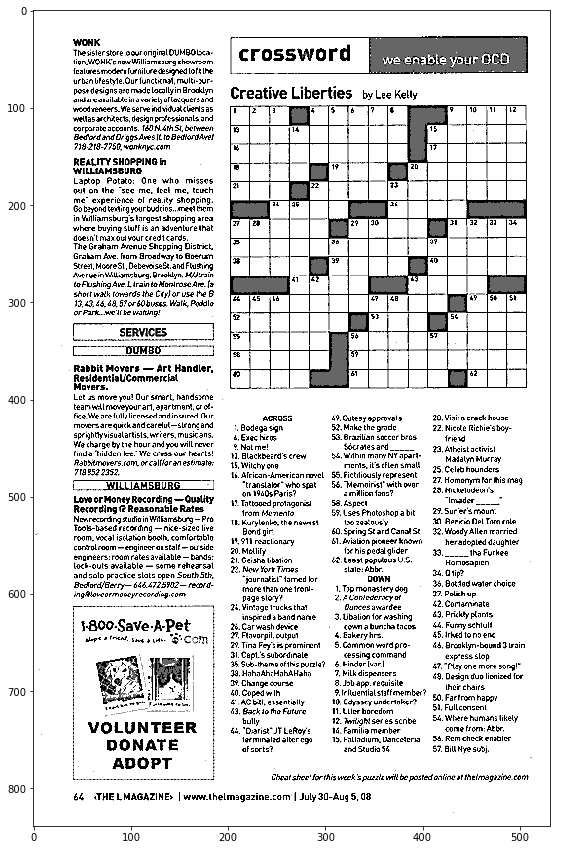

In [90]:
blended = cv2.addWeighted(src1=th1,alpha=0.6,src2=th2,beta=0.4,gamma=0)
show_pic(blended)

# Blurring and Smoothing - Part Two

In [91]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

In [92]:
def load_img():
    img = cv2.imread('./course_content/DATA/bricks.jpg').astype(np.float32)/255
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    return img

In [94]:
def display_img(img):
    fig = plt.figure(figsize=(12,10))
    ax = fig.add_subplot(111)
    ax.imshow(img)

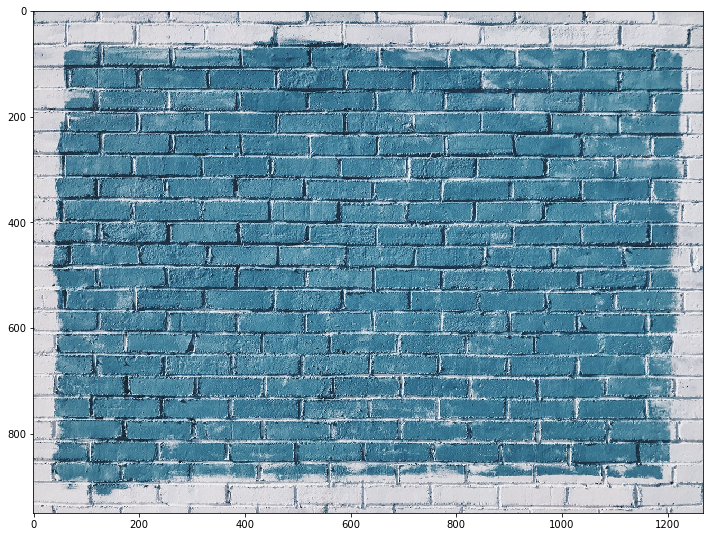

In [96]:
img = load_img()
display_img(img)

In [109]:
gamma = 1.6

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


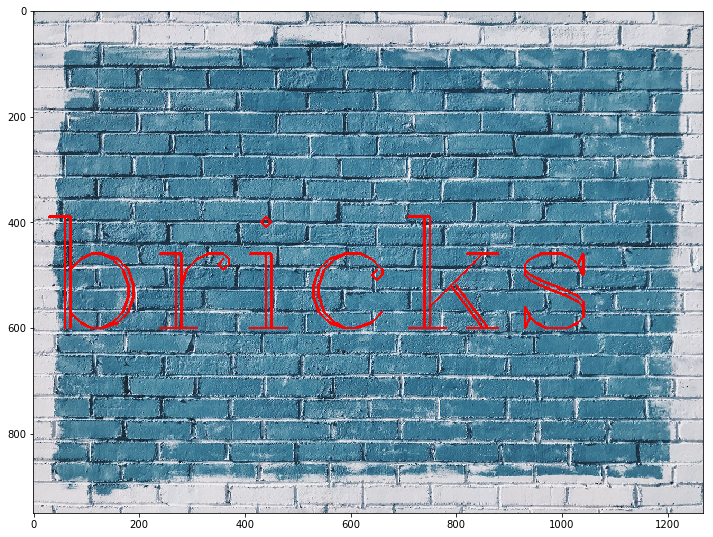

In [127]:
np.power(img,gamma)
display_img(img)

In [133]:
def img_with_text():
    img = load_img()
    font = cv2.FONT_HERSHEY_COMPLEX
    cv2.putText(img,text='bricks',org=(10,600),fontFace=font,fontScale=10,color=(255,0,0),thickness=4)
    print("Reset the image(new image with text on top of it!!)")
    return img

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


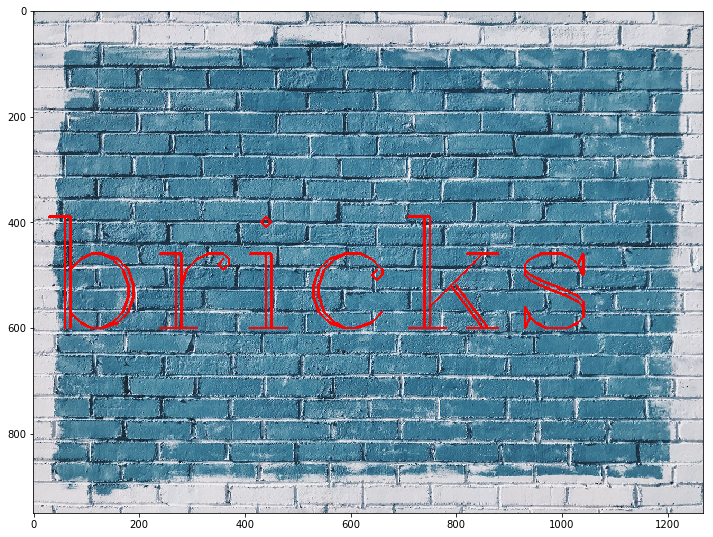

In [130]:
img = img_with_text()
display_img(img)

In [131]:
kernel = np.ones(shape=(5,5),dtype=np.float32)/25
kernel

array([[0.04, 0.04, 0.04, 0.04, 0.04],
       [0.04, 0.04, 0.04, 0.04, 0.04],
       [0.04, 0.04, 0.04, 0.04, 0.04],
       [0.04, 0.04, 0.04, 0.04, 0.04],
       [0.04, 0.04, 0.04, 0.04, 0.04]], dtype=float32)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


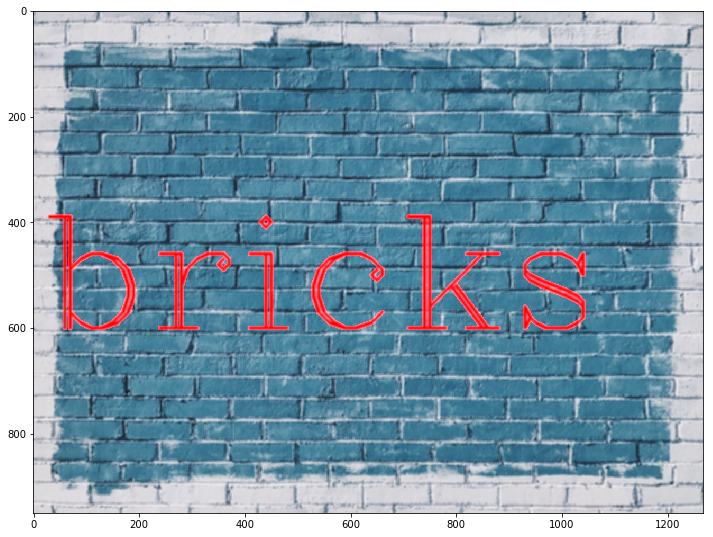

In [132]:
dst = cv2.filter2D(img,-1,kernel)
display_img(dst)

In [134]:
img = img_with_text() 

Reset the image(new image with text on top of it!!)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


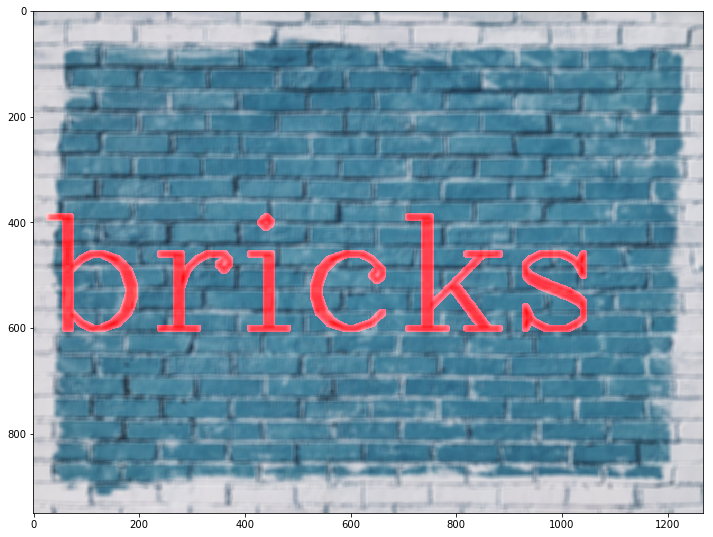

In [138]:
blurred = cv2.blur(img,ksize=(10,10))
display_img(blurred)

In [141]:
img = img_with_text() 
# display_img(img)

Reset the image(new image with text on top of it!!)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


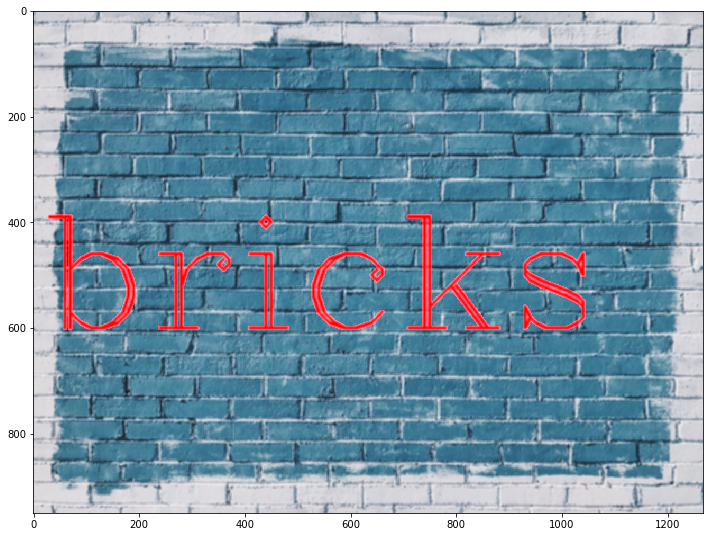

In [146]:
blurred_img = cv2.GaussianBlur(img,(5,5),10)
display_img(blurred_img)

In [147]:
img = img_with_text() 
# display_img(img)

Reset the image(new image with text on top of it!!)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


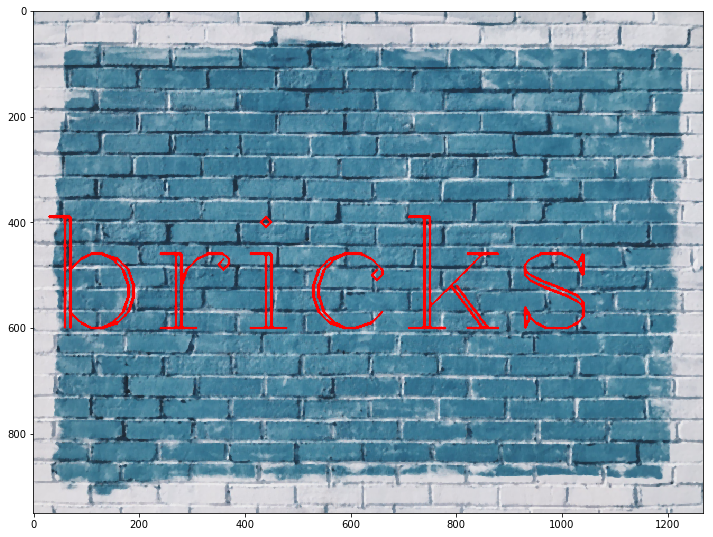

In [149]:
display_img(cv2.medianBlur(img,5))

In [151]:
img = cv2.imread('./course_content/DATA/sammy.jpg')
img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)

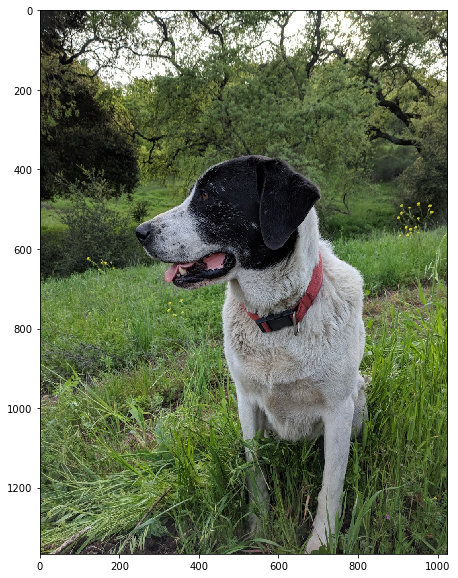

In [152]:
display_img(img)

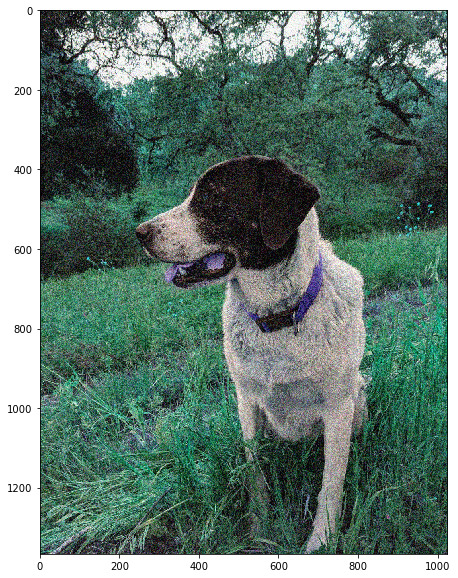

In [155]:
noise_img = cv2.imread('./course_content/DATA/sammy_noise.jpg')
noise_img = cv2.cvtColor(noise_img,cv2.COLOR_BGR2RGB)
display_img(noise_img)

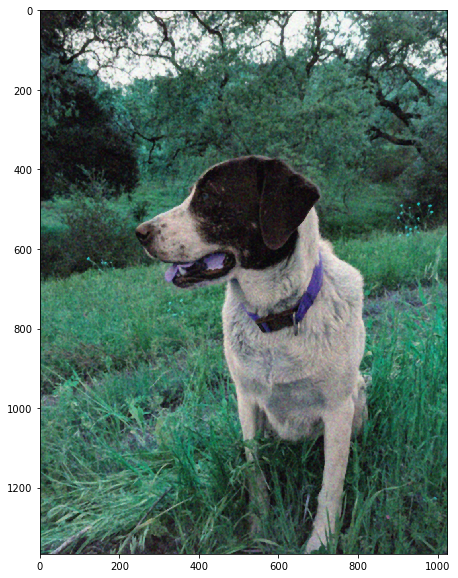

In [156]:
median = cv2.medianBlur(noise_img,5)
display_img(median)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Reset the image(new image with text on top of it!!)


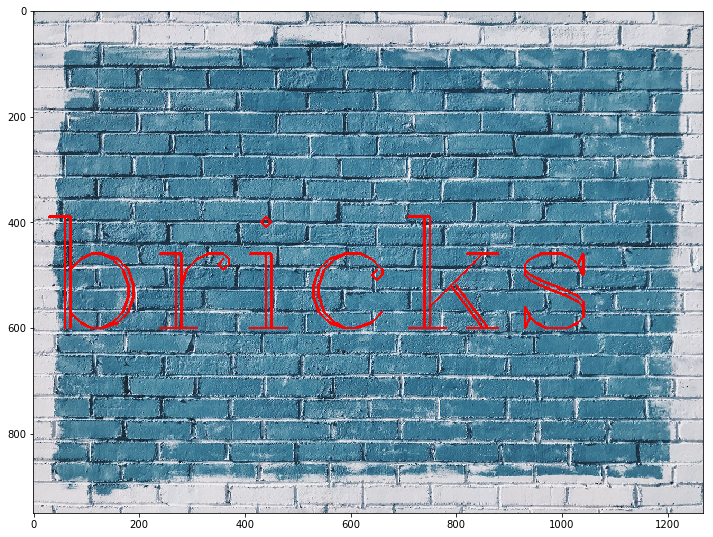

In [157]:
img = img_with_text() 
display_img(img)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


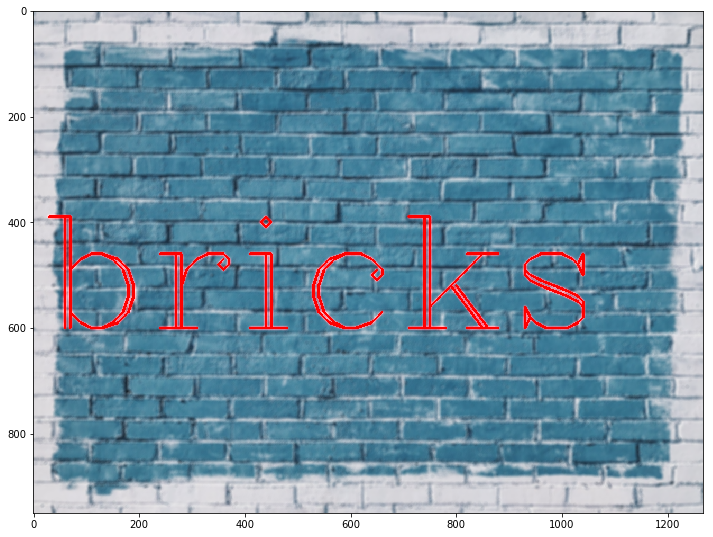

In [158]:
blur = cv2.bilateralFilter(img, 9,75,75)
display_img(blur)

# Morphological Operators

In [203]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

In [210]:
def load_img():
    blank_img = np.zeros((600,600))
    font = cv2.FONT_HERSHEY_SIMPLEX
    cv2.putText(blank_img,text="ABCDE",org=(50,300),fontFace=font,fontScale=5,color=(255,255,255),thickness=20)
    return blank_img

In [211]:
def display_img(img):
    fig = plt.figure(figsize=(12,10))
    ax = fig.add_subplot(111)
    ax.imshow(img,cmap='gray')

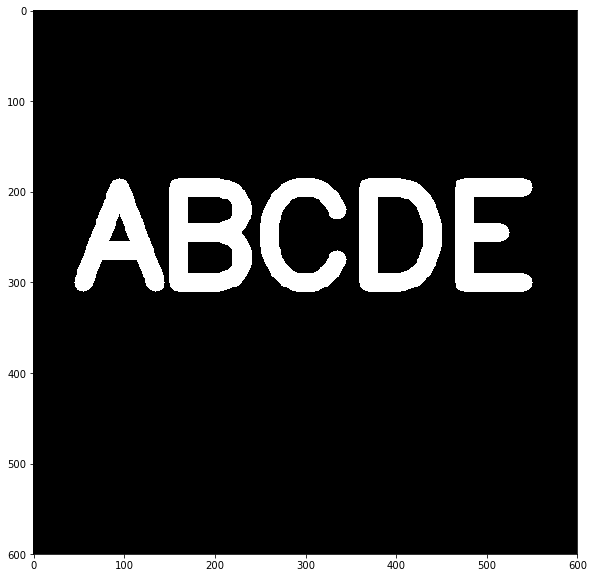

In [212]:
img = load_img()
display_img(img)

In [213]:
kernel = np.ones((5,5),dtype=np.uint8)

In [214]:
result = cv2.erode(img,kernel,iterations=4)

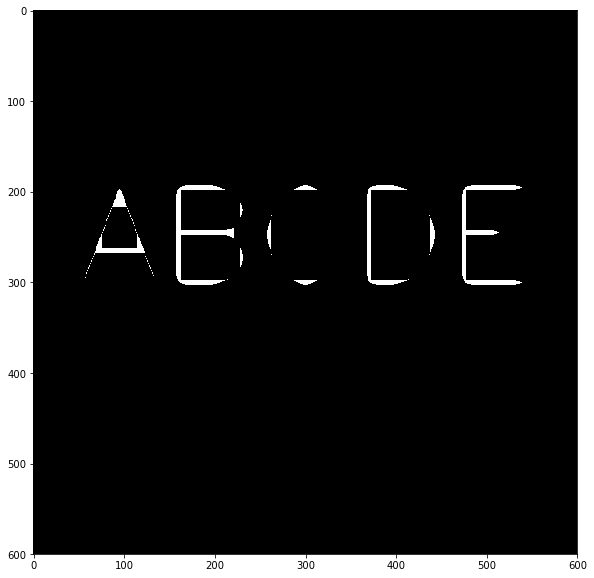

In [215]:
display_img(result)

In [216]:
img = load_img()
white_noise = np.random.randint(low=0,high=2,size=(600,600))

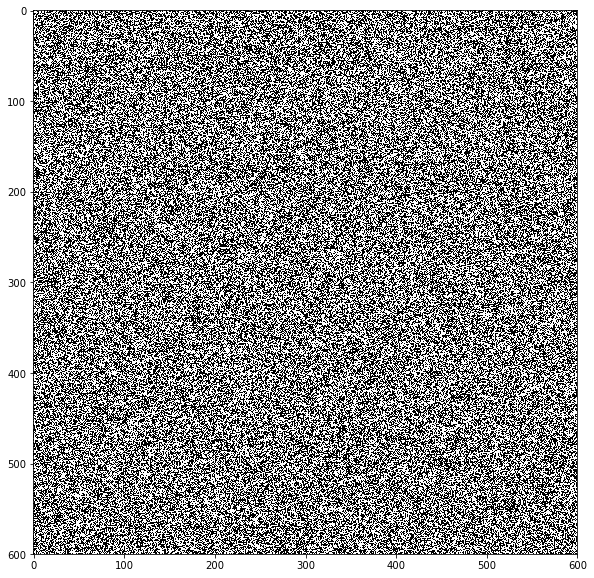

In [218]:
display_img(white_noise)

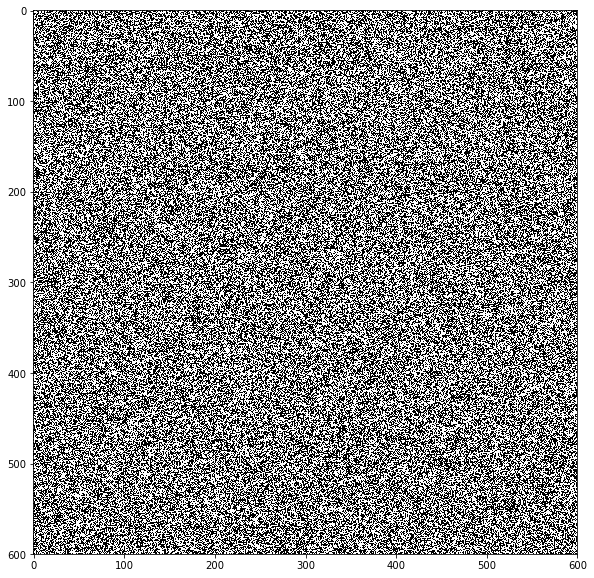

In [220]:
#adding noise to the image
white_noise = white_noise *255
display_img(white_noise)

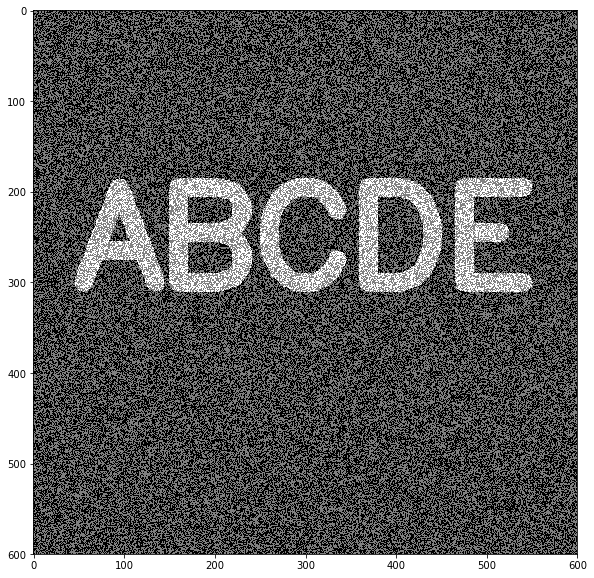

In [221]:
noise_img=white_noise+img
display_img(noise_img)

In [224]:
#clearing the noise from image
opening = cv2.morphologyEx(noise_img,cv2.MORPH_OPEN,kernel)

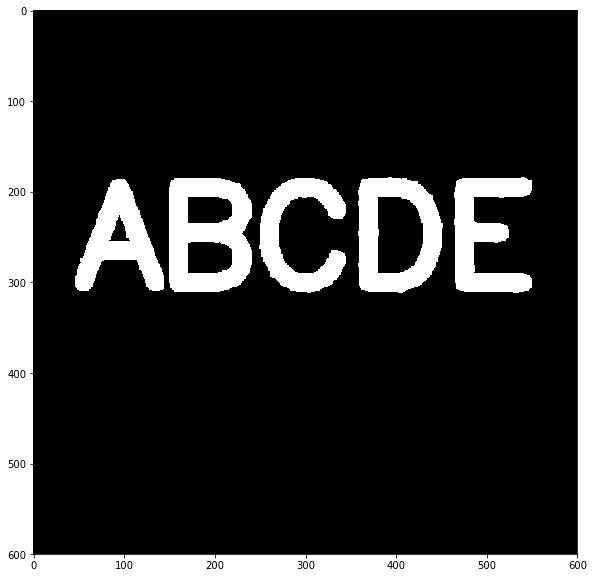

In [225]:
display_img(opening)

In [229]:
img = load_img()
black_noise = np.random.randint(low=0,high=2,size=(600,600))

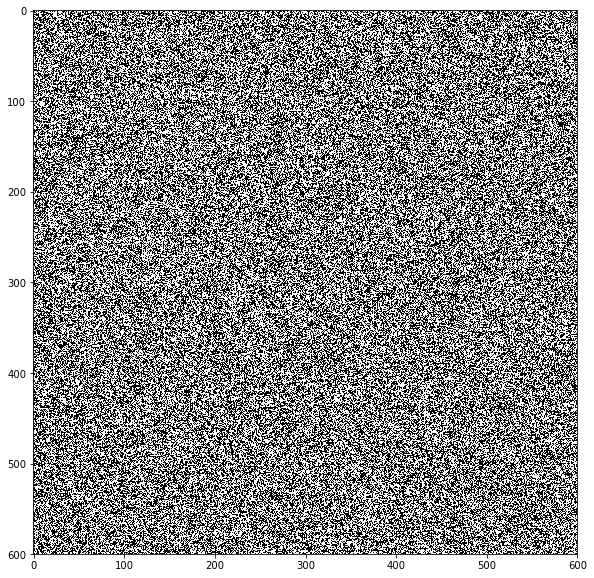

In [230]:
black_noise = black_noise * -255
display_img(black_noise)

In [234]:
black_noise_img = black_noise+img
black_noise_img[black_noise_img==-255]=0

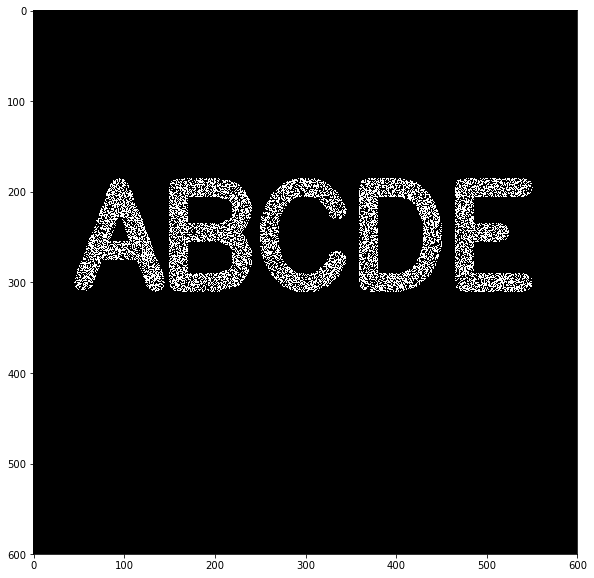

In [237]:
display_img(black_noise_img)

In [238]:
closing = cv2.morphologyEx(black_noise_img,cv2.MORPH_CLOSE,kernel)

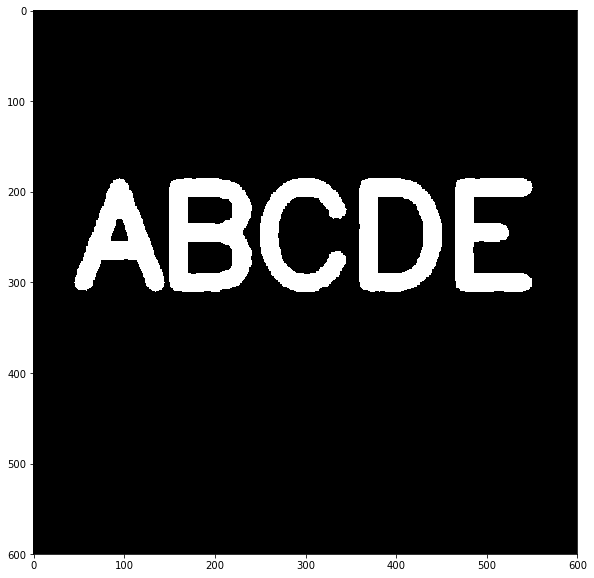

In [239]:
display_img(closing)

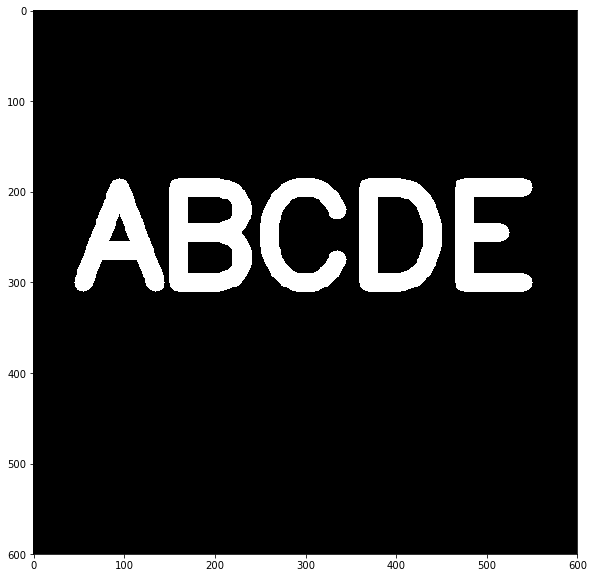

In [240]:
img = load_img()
display_img(img)

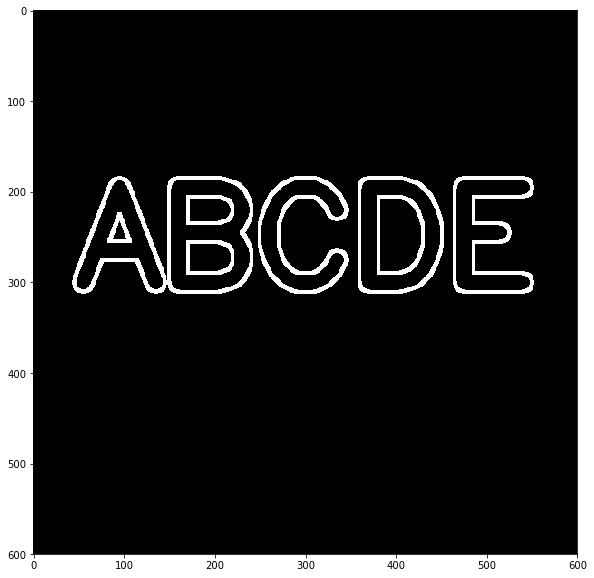

In [241]:
gradient = cv2.morphologyEx(img,cv2.MORPH_GRADIENT,kernel)
display_img(gradient)

# Gradients

In this lecture we will learn
    - Sobel-Feldman
    

In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

In [2]:
def display_img(img):
    fig = plt.figure(figsize=(12,10))
    ax = fig.add_subplot(111)
    ax.imshow(img,cmap='gray')

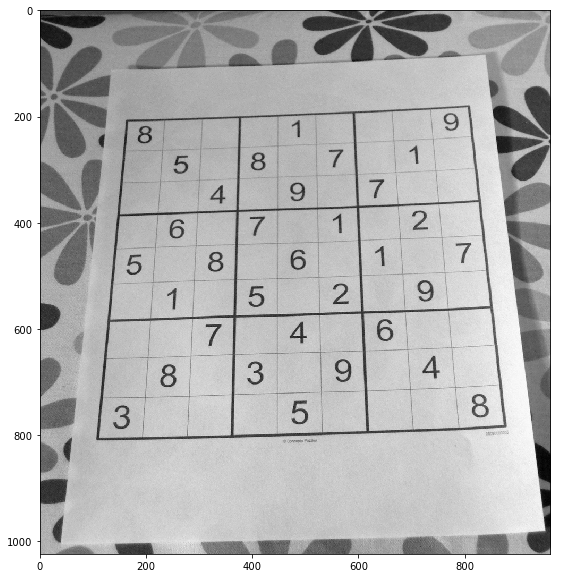

In [3]:
img = cv2.imread('./course_content/DATA/sudoku.jpg',0)
display_img(img)

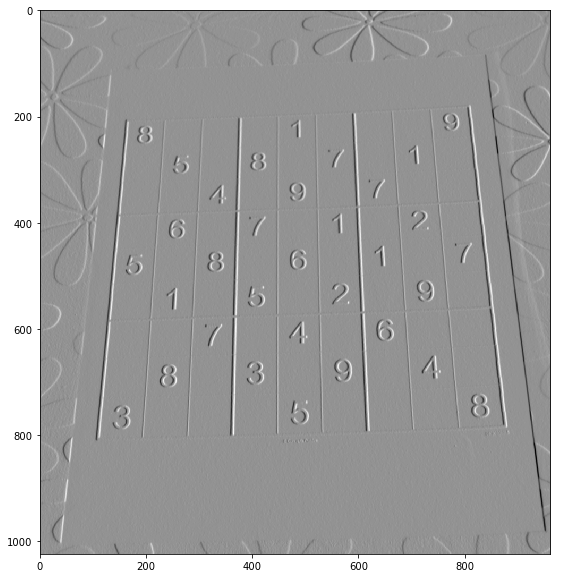

In [4]:
sobelx = cv2.Sobel(img,cv2.CV_64F,1,0,ksize=5)
display_img(sobelx)

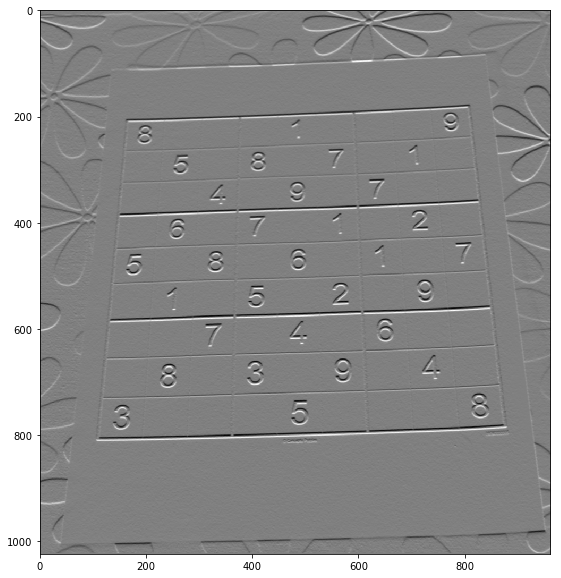

In [5]:
sobely = cv2.Sobel(img,cv2.CV_64F,0,1,ksize=5)
display_img(sobely)

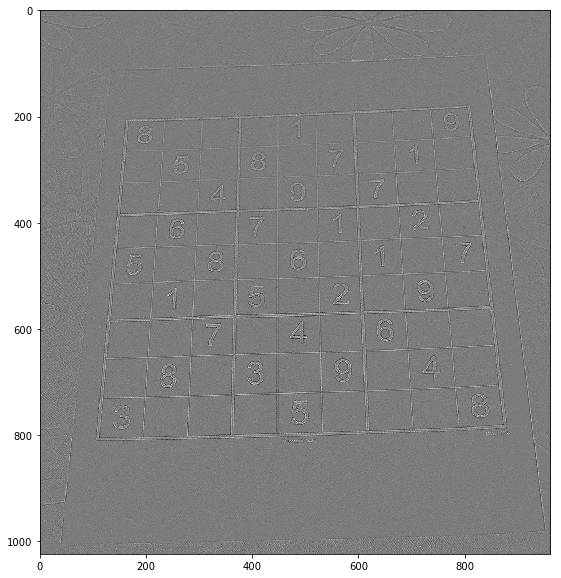

In [6]:
laplacian = cv2.Laplacian(img,cv2.CV_64F)
display_img(laplacian)

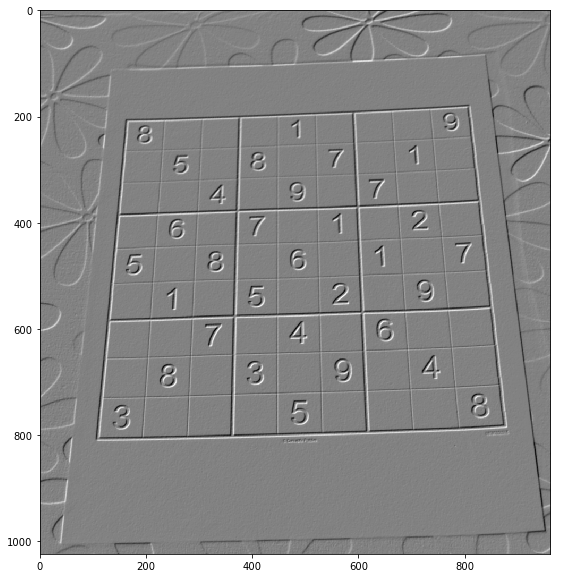

In [7]:
blended = cv2.addWeighted(src1=sobelx,alpha=0.5,src2=sobely,beta=0.5,gamma=0)
display_img(blended)

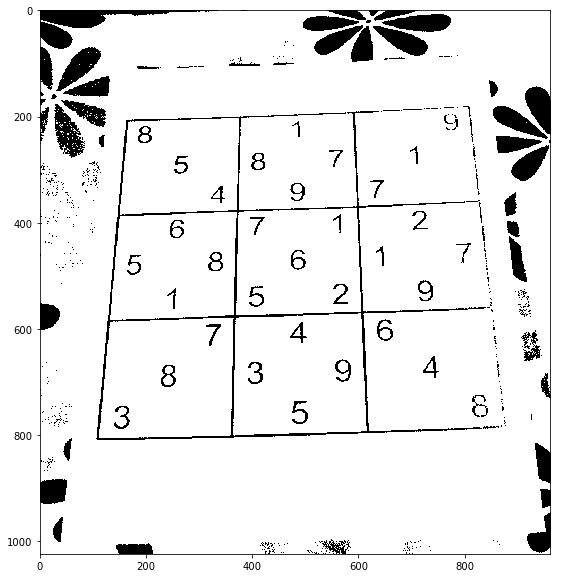

In [8]:
ret,th1= cv2.threshold(img,100,255,cv2.THRESH_BINARY)
display_img(th1)

In [9]:
kernel = np.ones((4,4),np.uint8)
gradient = cv2.morphologyEx(blended,cv2.MORPH_GRADIENT,kernel)

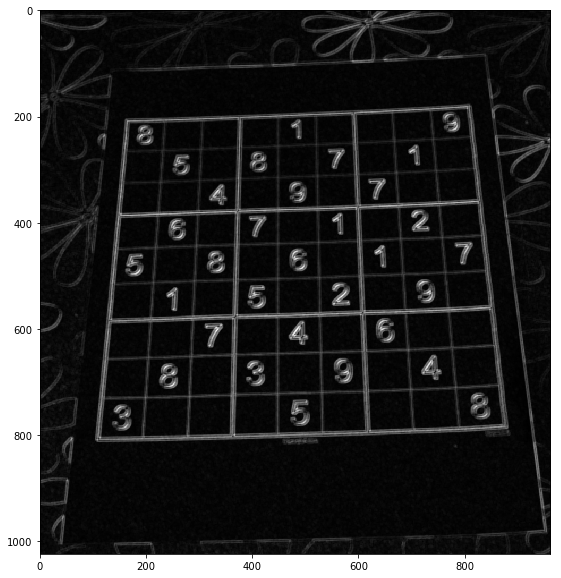

In [10]:
display_img(gradient)

# Histograms - Part One

In [1]:
import cv2 
import numpy as np
import matplotlib.pyplot as plt


In [3]:
dark_horse = cv2.imread('./course_content/DATA/horse.jpg')
show_horse = cv2.cvtColor(dark_horse, cv2.COLOR_BGR2RGB)

rainbow = cv2.imread('./course_content/DATA/rainbow.jpg')
show_rainbow = cv2.cvtColor(rainbow, cv2.COLOR_BGR2RGB)

blue_bricks = cv2.imread('./course_content/DATA/bricks.jpg')
show_bricks = cv2.cvtColor(blue_bricks, cv2.COLOR_BGR2RGB)

In [19]:
hist_values = cv2.calcHist([blue_bricks],channels=[0],mask=None,histSize=[256],ranges=[0,256])

In [20]:
hist_values.shape

(256, 1)

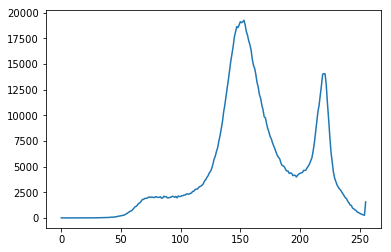

In [21]:
plt.plot(hist_values)

In [27]:
hist_values = cv2.calcHist([dark_horse],channels=[1],mask=None,histSize=[256],ranges=[0,256])

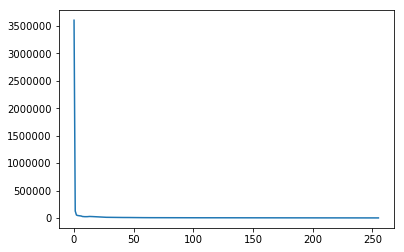

In [28]:
plt.plot(hist_values)

Text(0.5,1,'HISTOGRAM FORBLUE BRICHKS')

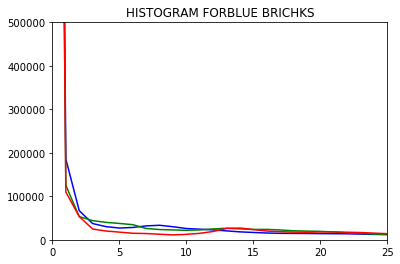

In [34]:
img = dark_horse
colors = ('b','g','r')

for i,color in enumerate(colors):
    histr = cv2.calcHist([img],[i],None,[256],[0,256])
    plt.plot(histr,color=color)
    plt.xlim([0,25])
    plt.ylim([0,500000])
plt.title("HISTOGRAM FORBLUE BRICHKS")

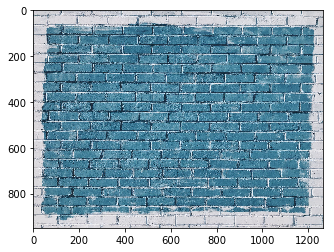

In [31]:
plt.imshow(show_bricks)

# Histograms - Part Two - Histogram Eqaulization

In [1]:
import cv2 
import numpy as np
import matplotlib.pyplot as plt

In [2]:
rainbow = cv2.imread('./course_content/DATA/rainbow.jpg')
show_rainbow = cv2.cvtColor(rainbow, cv2.COLOR_BGR2RGB)

In [3]:
img = rainbow

In [4]:
img.shape

(550, 413, 3)

In [5]:
mask = np.zeros(img.shape[:2],np.uint8)
mask.shape

(550, 413)

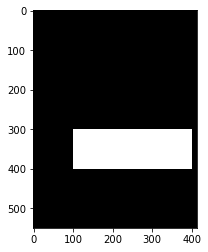

In [6]:
# plt.imshow(mask,cmap='gray')
mask[300:400,100:400] =255
plt.imshow(mask,cmap='gray')

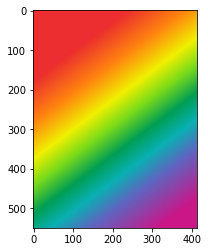

In [7]:
plt.imshow(show_rainbow)

In [8]:
masked_img = cv2.bitwise_and(img,img,mask=mask)

In [11]:
show_rainbow_img = cv2.bitwise_and(show_rainbow,show_rainbow,mask=mask)

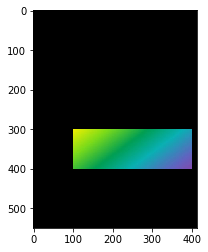

In [12]:
plt.imshow(show_rainbow_img)

In [14]:
hist_mask_values_red = cv2.calcHist([rainbow],channels=[2],mask=mask,histSize=[256],ranges=[0,256])

In [15]:
hist_values_red = cv2.calcHist([rainbow],channels=[2],mask=None,histSize=[256],ranges=[0,256])

Text(0.5,1,'Red Histogram for Masked Ranbow')

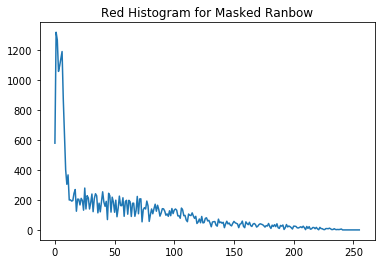

In [16]:
plt.plot(hist_mask_values_red)
plt.title("Red Histogram for Masked Ranbow")

Text(0.5,1,'Red Histogram for Normal Ranbow')

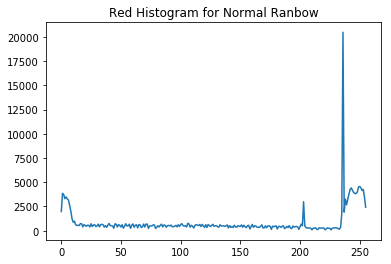

In [17]:
plt.plot(hist_values_red)
plt.title("Red Histogram for Normal Ranbow")

# Histograms Part Three - Histogram Equalization

In [18]:
gorilla = cv2.imread('course_content/DATA/gorilla.jpg',0)

In [19]:
def display(img,cmap=None):
    fig = plt.figure(figsize=(10,8))
    ax = fig.add_subplot(111)
    ax.imshow(img,cmap)

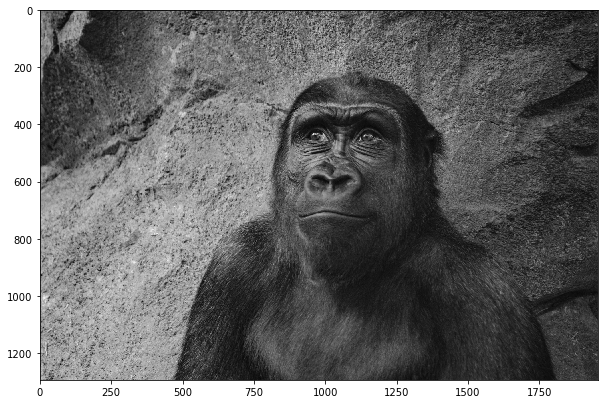

In [21]:
display(gorilla,cmap='gray')

In [22]:
gorilla.shape

(1295, 1955)

In [23]:
hist_values = cv2.calcHist([gorilla],channels=[0],mask=None,histSize=[256],ranges=[0,256])

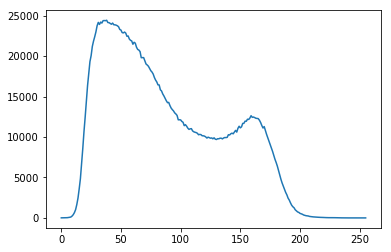

In [24]:
plt.plot(hist_values)

In [25]:
eq_gorilla = cv2.equalizeHist(gorilla)

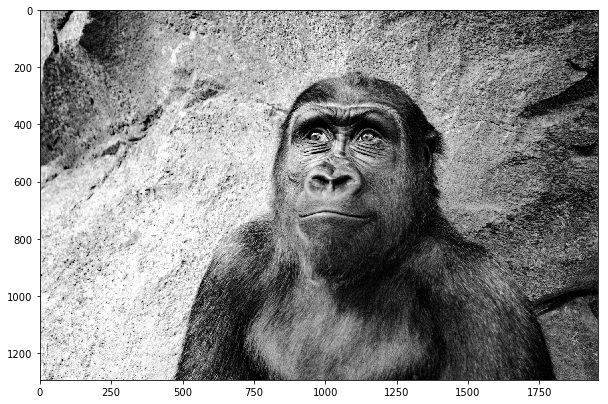

In [26]:
display(eq_gorilla,cmap='gray')

In [27]:
hist_values = cv2.calcHist([eq_gorilla],channels=[0],mask=None,histSize=[256],ranges=[0,256])

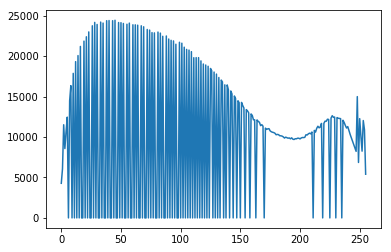

In [28]:
plt.plot(hist_values)

In [29]:
color_gorilla = cv2.imread('course_content/DATA/gorilla.jpg')

In [30]:
show_gorilla = cv2.cvtColor(color_gorilla,cv2.COLOR_BGR2RGB)

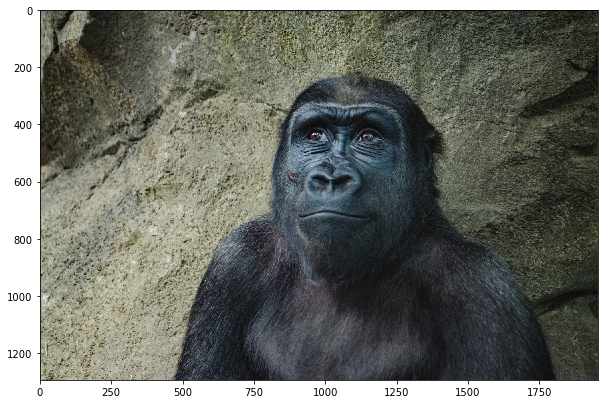

In [33]:
display(show_gorilla)

In [34]:
hsv = cv2.cvtColor(color_gorilla,cv2.COLOR_BGR2HSV)

In [37]:
hsv[:,:,2].min()

0

In [41]:
hsv[:,:,2] = cv2.equalizeHist(hsv[:,:,2])

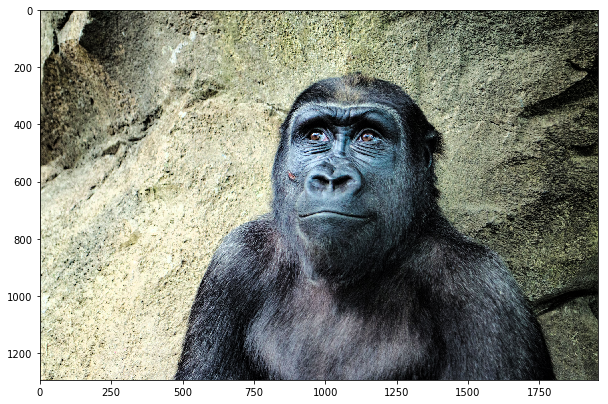

In [42]:
eq_color_gorallia = cv2.cvtColor(hsv,cv2.COLOR_HSV2RGB)
display(eq_color_gorallia)